In [1]:
import sys, warnings
warnings.filterwarnings('ignore')
sys.path.insert(0, '.')
sys.path.insert(0, '..')

import numpy as np
import pandas as pd

import config
from pipeline import data_prep, selection, plots, scoring

In [2]:
dd = data_prep.load_disease_filtered()
print(f'Final: {dd.Z_dis.shape[0]} samples, {len(np.unique(dd.dis_pheno))} phenotypes')
print(pd.Series(dd.dis_pheno).value_counts().to_string())

Final: 854 samples, 20 phenotypes
CAD_HF+ (Ward)                     112
Tuberculosis (Chang)               101
CAD_HF- (Ward)                     100
ME/CFS (Gardella)                   90
Pancreatitis (Moore)                79
Pancreatic Cancer (Moore)           72
Pre-eclampsia (Moufarrej)           59
Colorectal Cancer (Chen)            37
Lung Cancer (Chen)                  30
Liver Cancer (Roskams-Hieter)       28
Esophagus Cancer (Chen)             25
Stomach Cancer (Chen)               24
MM (Roskams-Hieter)                 17
Other Cancer (Moore)                16
HIV (Chang)                         13
ICI-m (Raissadati)                  11
ICI-treated Cancer (Raissadati)     11
HIV + Tuberculosis (Chang)          11
Liver Cancer (Chen)                 10
MGUS (Roskams-Hieter)                8


In [3]:
Z_hc, hc_names = data_prep.load_z_hc()
print(f'Z_hc: {Z_hc.shape}')

Z_hc: (693, 20090)


## gene selection criteria

In [1]:
route = scoring.gene_stage(dd.gene_names)
# fdr_method: 'fdr_bh' (default, comparable to DESeq2 padj) | 'fdr_by' (conservative,
# valid under arbitrary dependence) | 'storey' (less conservative, estimates true-null
# fraction from the data; not directly comparable to BH-based references)
plots.plot_zscore_outlier_hist(dd.Z_dis, dd.dis_pheno, route=route,
                               padj_thr=0.10, fdr_method='fdr_bh')

NameError: name 'scoring' is not defined

In [5]:
all_results, SELECTORS = selection.run_selection(dd.Z_dis, Z_hc, dd.dis_pheno, dd.gene_names)

proportion_top30: sil=-0.010  n_genes=536  (0s)
effect_size_top30: sil=-0.006  n_genes=503  (0s)


svd_top30: sil=-0.002  n_genes=477  (0s)
effect_specific_top30: sil=-0.007  n_genes=508  (0s)


l1_logistic_top30: sil=0.001  n_genes=534  (15s)


In [6]:
# selector summary: gene-set size + leakage-free unsupervised structure (silhouette).
# supervised AUC/AUPRC is evaluated separately and leakage-free in run_validation below.
global_summary = pd.DataFrame([
    dict(method=k,
         n_genes=v['n_genes'],
         macro_sil=v['macro_sil'],
         elapsed_s=int(v['t']))
    for k, v in all_results.items()
]).set_index('method').sort_values('macro_sil', ascending=False).round(3)

print('== Selector summary (unsupervised) ==')
display(global_summary)

== Selector summary (unsupervised) ==


,n_genes,macro_sil,elapsed_s
method,,,
l1_logistic_top30,534,0.001,15
svd_top30,477,-0.002,0
effect_size_top30,503,-0.006,0
effect_specific_top30,508,-0.007,0
proportion_top30,536,-0.010,0


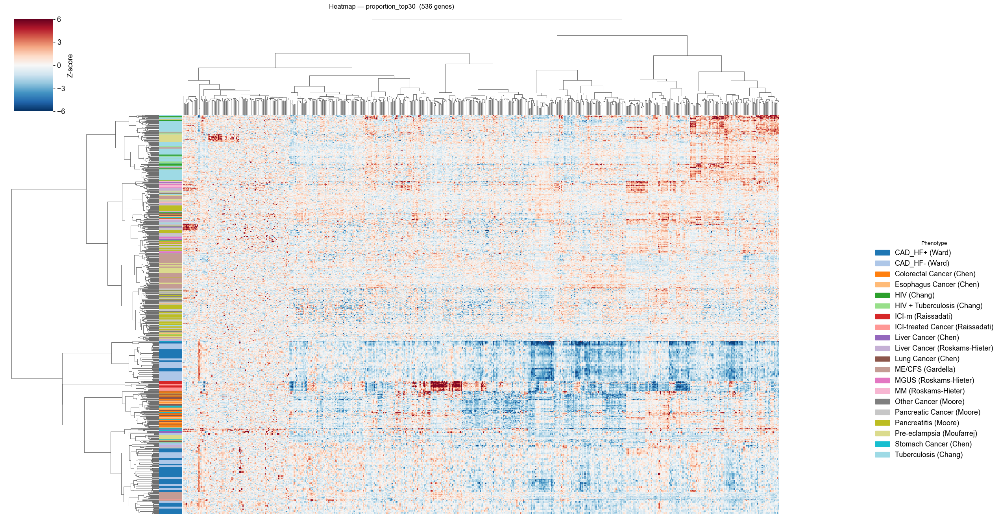

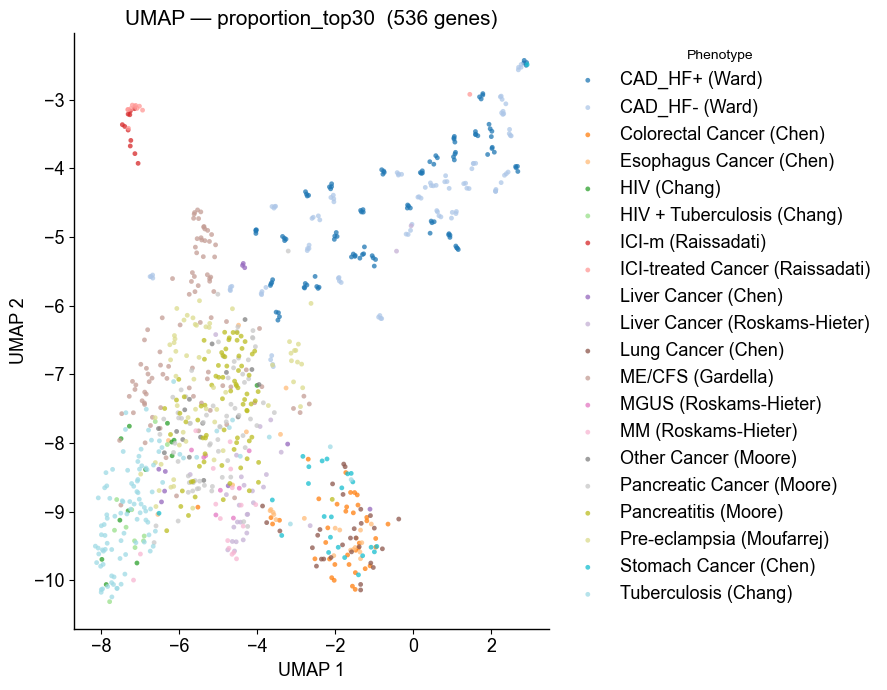

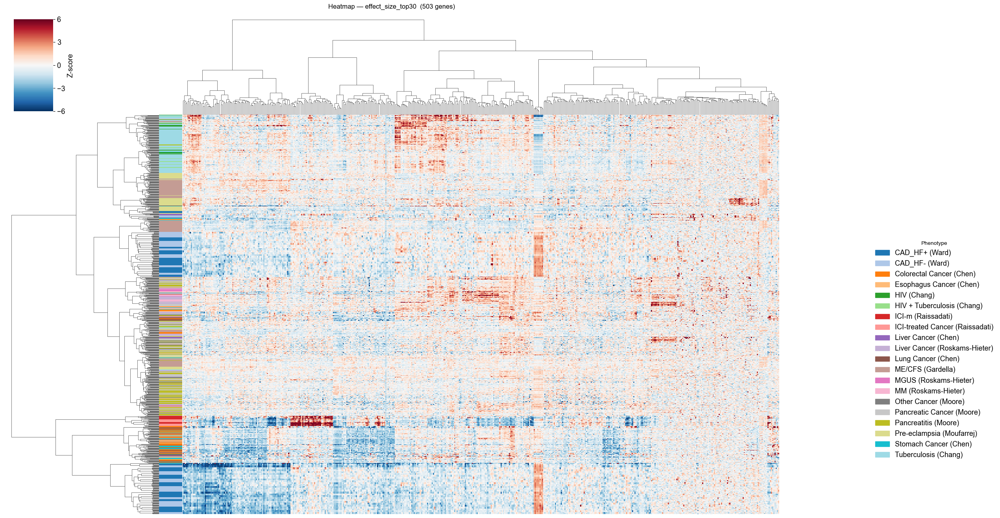

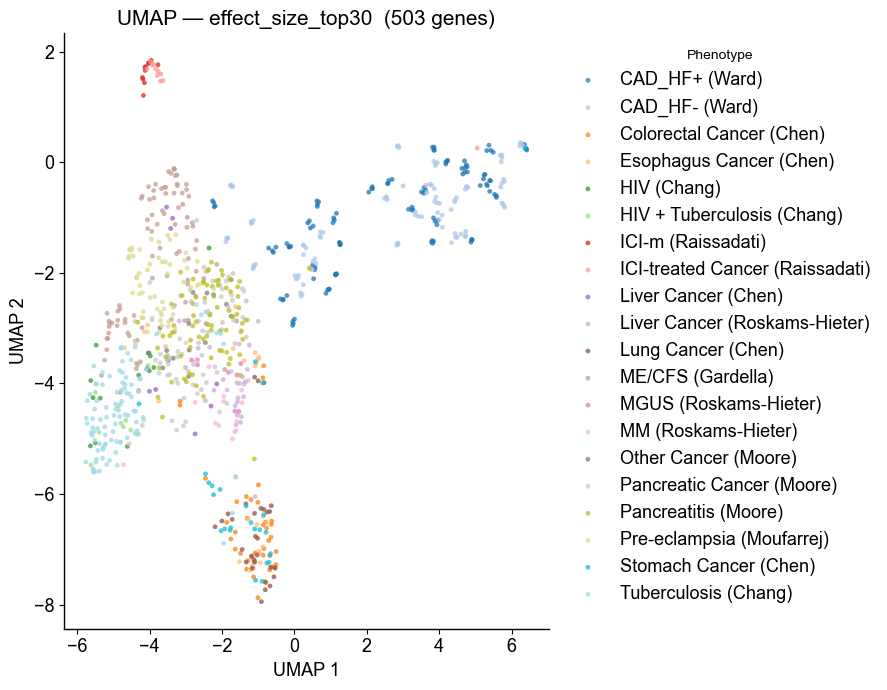

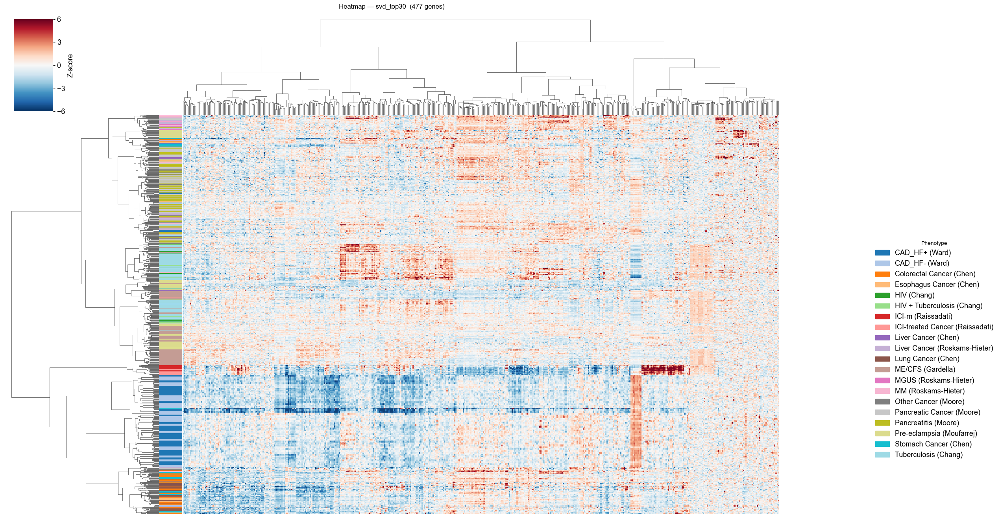

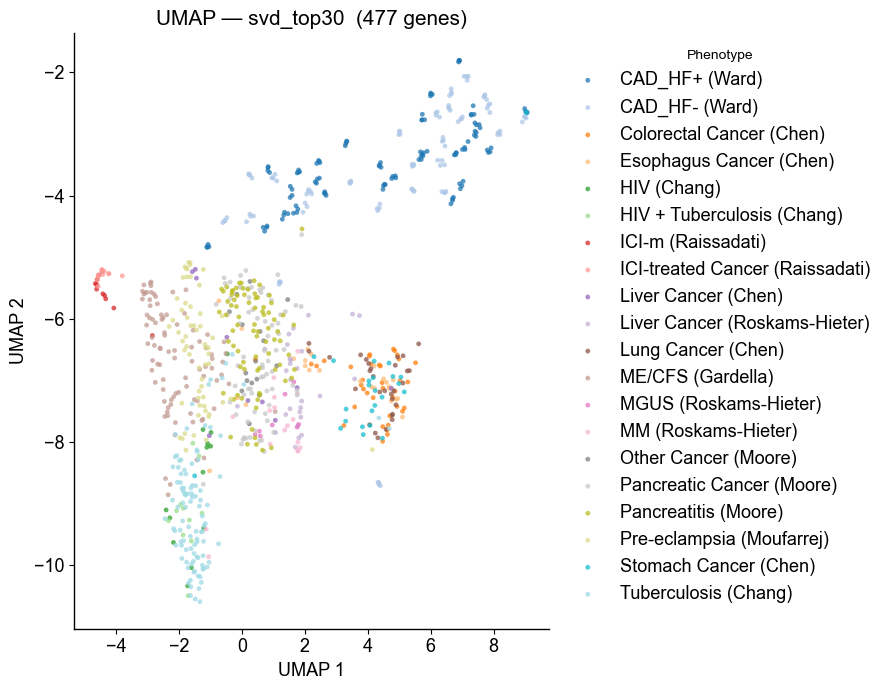

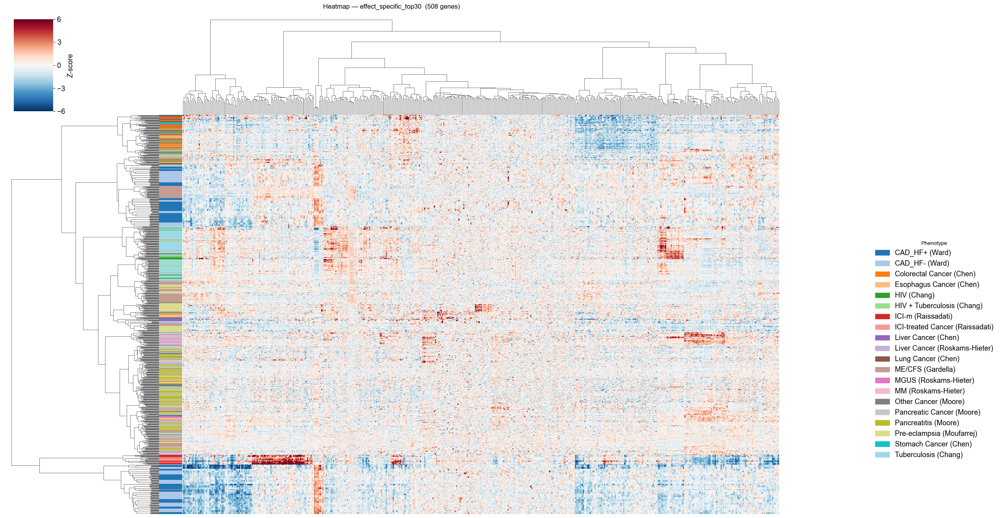

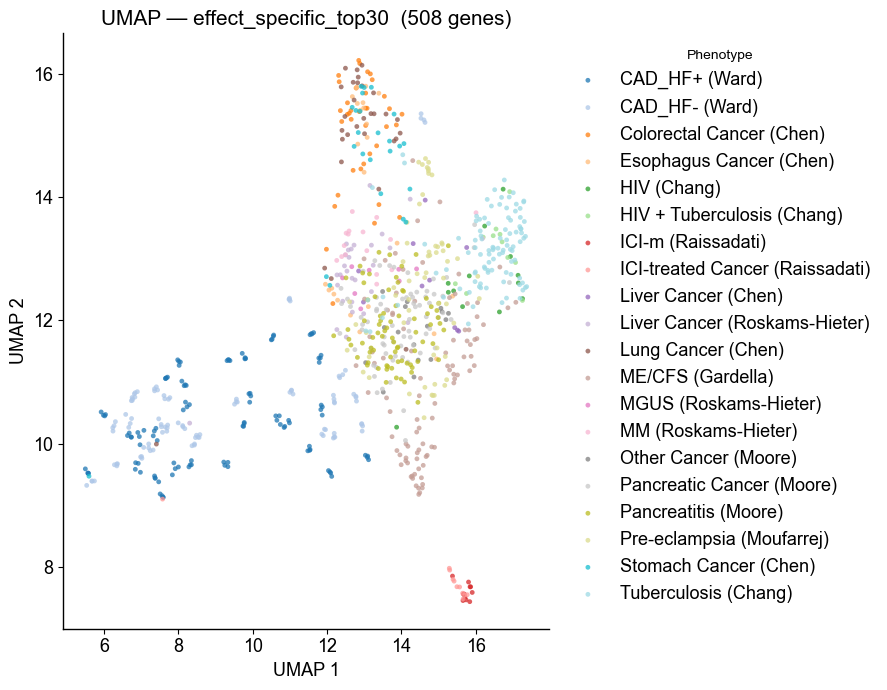

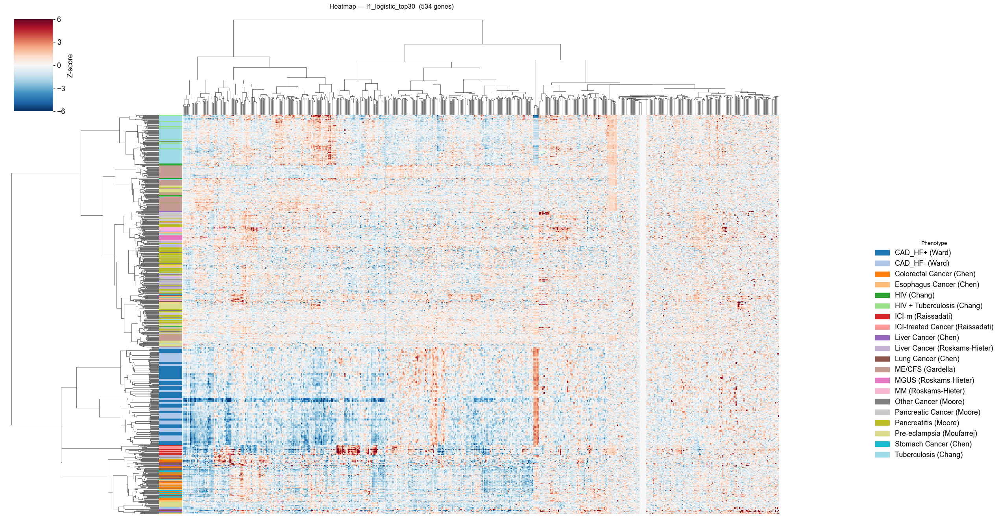

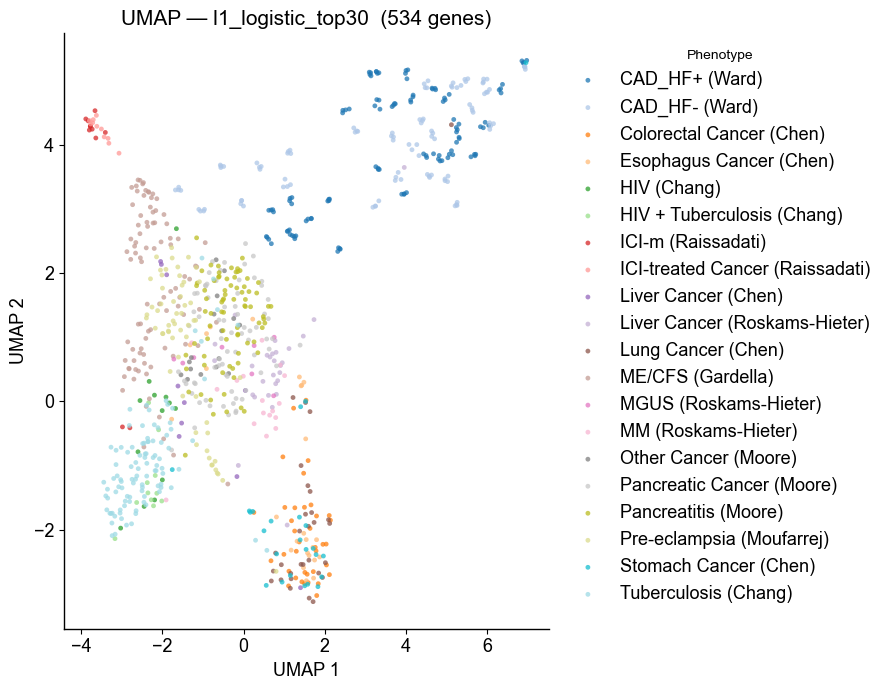

In [7]:
# selected-gene-set structure (clustermap/UMAP) per method -> CV_Results/Figures/
# (supervised ROC/PR moved to the leakage-controlled validation section below)
for key in SELECTORS:
    plots.plot_selection_overview(key, all_results, dd.Z_dis, dd.dis_pheno, dd.dis_names, dd.gene_names)

## AUC-based Benchmark

In [8]:
# per-seed AUCs: random / disease-matched batch_null / disease. full_z = no selection.
out_path = config.CV_RESULTS_DIR / 'discrimination_raw.csv'
if out_path.exists():
    disc = pd.read_csv(out_path)
else:   
    hc_batch = data_prep.hc_batch_ids(hc_names)
    dis_batch = data_prep.hc_batch_ids(dd.dis_names)   # same name->Batch_ID map, for disease rows
    disc = selection.discrimination_control(
        dd.Z_dis, dd.dis_pheno, dis_batch, Z_hc, hc_batch, dd.gene_names)
    disc.to_csv(config.CV_RESULTS_DIR / 'discrimination_raw.csv', index=False)
print(disc.shape); disc.head()

full_z: random median=0.476  batch_null median=0.739  disease median=0.937


proportion: random median=0.474  batch_null median=0.704  disease median=0.949


effect_size: random median=0.502  batch_null median=0.678  disease median=0.963


svd: random median=0.524  batch_null median=0.807  disease median=0.963
(656, 6)


,method,phenotype,kind,seed,n_pos,auc
0,full_z,,random,42,346,0.458168
1,full_z,,random,43,346,0.465669
2,full_z,,random,44,346,0.485558
3,full_z,,random,45,346,0.556102
4,full_z,CAD_HF+ (Ward),batch_null,42,288,0.642019


In [9]:
# method x kind summary: distribution of the per-seed AUCs (random < batch_null << disease)
if (config.CV_RESULTS_DIR / 'discrimination_summary.csv').exists():
    disc_summary = pd.read_csv(config.CV_RESULTS_DIR / 'discrimination_summary.csv')
else:
     disc_summary = (disc.groupby(['method', 'kind'])['auc']
                    .agg(n='size', mean='mean', std='std', median='median',
                         q25=lambda x: x.quantile(.25), q75=lambda x: x.quantile(.75))
                    .round(3).reset_index())
     disc_summary.to_csv(config.CV_RESULTS_DIR / 'discrimination_summary.csv', index=False)
disc_summary

,method,kind,n,mean,std,median,q25,q75
0,effect_size,batch_null,80,0.665,0.063,0.678,0.626,0.699
1,effect_size,disease,80,0.925,0.089,0.963,0.871,0.997
2,effect_size,random,4,0.493,0.028,0.502,0.486,0.508
3,full_z,batch_null,80,0.738,0.047,0.739,0.711,0.781
4,full_z,disease,80,0.935,0.054,0.937,0.917,0.978
5,full_z,random,4,0.491,0.045,0.476,0.464,0.503
6,proportion,batch_null,80,0.699,0.053,0.704,0.647,0.737
7,proportion,disease,80,0.913,0.098,0.949,0.853,0.994
8,proportion,random,4,0.477,0.012,0.474,0.471,0.481
9,svd,batch_null,80,0.802,0.048,0.807,0.783,0.834


In [10]:
# per-disease paired table (batch_null vs disease), averaged over seeds. Default full_z.
if (config.CV_RESULTS_DIR / 'discrimination_disease_pairs_full_z.csv').exists():
    disc_pairs = pd.read_csv(config.CV_RESULTS_DIR / 'discrimination_disease_pairs_full_z.csv')
else:
    def disease_pairs(method='full_z'):
        d = disc[(disc['method'] == method) & (disc['kind'].isin(['batch_null', 'disease']))]
        g = (d.groupby(['phenotype', 'kind'])['auc'].mean().unstack('kind')
            .rename(columns={'batch_null': 'batch_null_auc', 'disease': 'disease_auc'}))
        n = disc[(disc.method == method) & (disc.kind == 'disease')].groupby('phenotype')['n_pos'].first()
        g.insert(0, 'n', n)
        g['gap'] = g['disease_auc'] - g['batch_null_auc']
        return g.sort_values('gap', ascending=False).round(3)

    disc_pairs = disease_pairs('full_z')
    disc_pairs.to_csv(config.CV_RESULTS_DIR / 'discrimination_disease_pairs_full_z.csv')
disc_pairs

,phenotype,n,batch_null_auc,disease_auc,gap
0,CAD_HF+ (Ward),112,0.682,0.965,0.284
1,ICI-treated Cancer (Raissadati),11,0.735,1.000,0.265
2,ICI-m (Raissadati),11,0.735,1.000,0.265
3,CAD_HF- (Ward),100,0.682,0.942,0.260
4,HIV + Tuberculosis (Chang),11,0.748,0.988,0.240
5,Liver Cancer (Chen),10,0.735,0.966,0.231
6,Pancreatic Cancer (Moore),72,0.707,0.932,0.224
7,Tuberculosis (Chang),101,0.752,0.976,0.224
8,Pancreatitis (Moore),79,0.707,0.925,0.218
9,MGUS (Roskams-Hieter),8,0.773,0.991,0.217
